# Baseline Forecasting: Previous Day's Price

This notebook implements a baseline forecasting approach using the **Previous Day's Price** as the forecast for the next day. Baseline models serve as a simple yet effective benchmark, allowing us to evaluate the performance of more complex deep learning models.

#### Objectives:
- Compute the Previous Day's Price forecast.
- Evaluate its performance using standard error metrics.
- Generate visualizations and plots to analyze forecast accuracy.

By establishing this baseline, we can assess whether deep learning architectures provide a significant improvement over naive forecasting methods.

In [1]:
import pandas as pd

def yesterday_baseline(df, date_col='ds', price_col='y'):
    """
    Given a time series df with columns:
      - ds (timestamps, hourly)
      - y  (actual prices)
    Return a DataFrame with a new column 'baseline_pred'
    that is the price from exactly 7 days earlier.

    If ds-7days does not exist in df, set baseline_pred = NaN (or handle it differently).
    """

    # Sort by datetime
    df = df.sort_values(date_col).reset_index(drop=True)

    # Shift the price by 7 days
    # 1) Create a version of df with ds advanced by 7 days
    df_shifted = df.copy()
    df_shifted[date_col] = df_shifted[date_col] + pd.Timedelta(days=1)

    # 2) Merge original df with shifted df on the new ds
    merged = pd.merge(
        df,
        df_shifted[[date_col, price_col]],
        on=date_col,
        how='inner',
        suffixes=('', '_yesterday')
    )

    # 3) Rename the merged price _yesterday to 'baseline_pred'
    merged.rename(columns={f'{price_col}_yesterday':'baseline_pred'}, inplace=True)

    return merged


In [2]:
import pandas as pd

test_df = pd.read_csv('~/data/Germany_time_zone/all/test_with_all.csv')

# Convert to UTC while handling DST ambiguities
test_df['ds'] = pd.to_datetime(test_df['ds']).dt.tz_localize('Europe/Berlin', ambiguous='infer').dt.tz_convert('UTC')

print("First date in test_df:", test_df['ds'].min())
print("Last date in test_df:", test_df['ds'].max())


baseline_df = yesterday_baseline(test_df, date_col='ds', price_col='y')

First date in test_df: 2023-12-31 23:00:00+00:00
Last date in test_df: 2024-12-31 22:00:00+00:00


In [3]:
baseline_df.head(10)

,ds,y,unique_id,day_of_week,month,hour,is_weekend,is_holiday,month_sin,month_cos,...,hour_sin,hour_cos,gas_price,cross_border_trading,non_renewable,renewable,load,co2_emission_allowances,synthetic_price,baseline_pred
0,2024-01-01 23:00:00+00:00,30.59,electricity_prices,1,1,0,0,0,0.5,0.866025,...,0.000000,1.000000e+00,31.634,-2049.5725,8652.642358,30446.35063,38389.9200,66.6,84.156364,0.10
1,2024-01-02 00:00:00+00:00,20.07,electricity_prices,1,1,1,0,0,0.5,0.866025,...,0.258819,9.659258e-01,31.634,-1719.9150,8582.390987,29672.75853,37078.0800,66.6,84.156364,0.01
2,2024-01-02 01:00:00+00:00,31.03,electricity_prices,1,1,2,0,0,0.5,0.866025,...,0.500000,8.660254e-01,31.634,-2226.0475,8627.772836,29567.59048,37041.8675,66.6,84.156364,0.00
3,2024-01-02 02:00:00+00:00,18.39,electricity_prices,1,1,3,0,0,0.5,0.866025,...,0.707107,7.071068e-01,31.634,-2075.6400,8760.719069,31286.97161,37358.4775,66.6,84.156364,-0.01
4,2024-01-02 03:00:00+00:00,11.08,electricity_prices,1,1,4,0,0,0.5,0.866025,...,0.866025,5.000000e-01,31.634,-2903.8075,8873.528725,33616.55447,39411.9150,66.6,84.156364,-0.03
5,2024-01-02 04:00:00+00:00,13.78,electricity_prices,1,1,5,0,0,0.5,0.866025,...,0.965926,2.588190e-01,31.634,-4030.1800,9201.584807,36615.93972,42453.6650,66.6,84.156364,-0.02
6,2024-01-02 05:00:00+00:00,47.63,electricity_prices,1,1,6,0,0,0.5,0.866025,...,1.000000,6.123234e-17,31.634,-3799.9950,9665.409542,39827.19502,47725.9000,66.6,84.156364,-0.05
7,2024-01-02 06:00:00+00:00,58.10,electricity_prices,1,1,7,0,0,0.5,0.866025,...,0.965926,-2.588190e-01,31.634,-3082.2500,10197.999040,41617.02734,52564.7650,66.6,84.156364,-0.02
8,2024-01-02 07:00:00+00:00,65.67,electricity_prices,1,1,8,0,0,0.5,0.866025,...,0.866025,-5.000000e-01,31.634,-3239.6175,10993.116720,42927.76322,56047.4700,66.6,84.156364,0.00
9,2024-01-02 08:00:00+00:00,64.73,electricity_prices,1,1,9,0,0,0.5,0.866025,...,0.707107,-7.071068e-01,31.634,-3649.0900,11756.525970,43130.33463,57931.3725,66.6,84.156364,0.04


In [4]:
test_df.head()

,ds,y,unique_id,day_of_week,month,hour,is_weekend,is_holiday,month_sin,month_cos,...,day_of_week_cos,hour_sin,hour_cos,gas_price,cross_border_trading,non_renewable,renewable,load,co2_emission_allowances,synthetic_price
0,2023-12-31 23:00:00+00:00,0.10,electricity_prices,0,1,0,0,1,0.5,0.866025,...,1.0,0.000000,1.000000,31.574,-11728.9125,8378.536596,41778.25343,40170.0900,66.6,84.047273
1,2024-01-01 00:00:00+00:00,0.01,electricity_prices,0,1,1,0,1,0.5,0.866025,...,1.0,0.258819,0.965926,31.574,-11129.9725,8284.442818,41522.96191,38818.1500,66.6,84.047273
2,2024-01-01 01:00:00+00:00,0.00,electricity_prices,0,1,2,0,1,0.5,0.866025,...,1.0,0.500000,0.866025,31.574,-11635.4075,8282.031575,41346.84615,37847.5650,66.6,84.047273
3,2024-01-01 02:00:00+00:00,-0.01,electricity_prices,0,1,3,0,1,0.5,0.866025,...,1.0,0.707107,0.707107,31.574,-11492.7000,8318.301450,40363.41746,37123.2325,66.6,84.047273
4,2024-01-01 03:00:00+00:00,-0.03,electricity_prices,0,1,4,0,1,0.5,0.866025,...,1.0,0.866025,0.500000,31.574,-10593.8850,8309.993639,40234.70911,36753.5150,66.6,84.047273


In [5]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np

mae  = mean_absolute_error(baseline_df['y'], baseline_df['baseline_pred'])
mse  = mean_squared_error(baseline_df['y'], baseline_df['baseline_pred'])
rmse = np.sqrt(mse)

print(f"yesterday Baseline:\n  MAE = {mae:.2f}\n  RMSE= {rmse:.2f}")

yesterday Baseline:
  MAE = 27.85
  RMSE= 44.35


In [6]:
# baseline_df columns: ['ds', 'y', 'baseline_pred']
# We rename 'baseline_pred' -> 'y_pred'
import pandas as pd

forecast_df = baseline_df.copy()
forecast_df.rename(columns={'baseline_pred': 'y_pred'}, inplace=True)

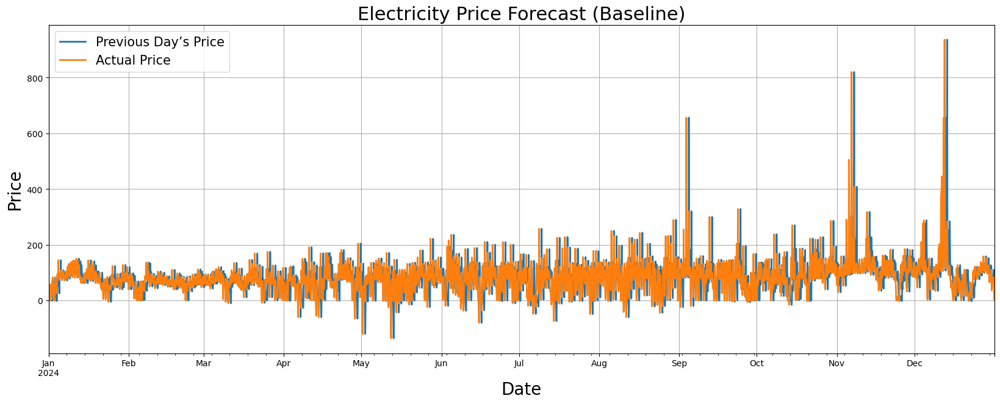

In [7]:
import matplotlib.pyplot as plt

model_name = 'Previous Day’s Price'  # a label for the legend

# Convert to datetime if needed
forecast_df['ds'] = pd.to_datetime(forecast_df['ds'])
test_df['ds'] = pd.to_datetime(test_df['ds'])

fig, ax = plt.subplots(figsize=(20, 7))

# Plot baseline predictions
forecast_df.set_index('ds')['y_pred'].plot(ax=ax, linewidth=2, label=f'{model_name}')

# Plot actual test values
test_df.set_index('ds')['y'].plot(ax=ax, linewidth=2, label='Actual Price')

# Formatting
ax.set_title('Electricity Price Forecast (Baseline)', fontsize=22)
ax.set_ylabel('Price', fontsize=20)
ax.set_xlabel('Date', fontsize=20)
ax.legend(prop={'size': 15})
ax.grid()
plt.show()

/scratch/slurm_tmpdir/job_25372413/ipykernel_481115/227044284.py:2: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  unique_months = forecast_df['ds'].dt.to_period('M').unique()
/scratch/slurm_tmpdir/job_25372413/ipykernel_481115/227044284.py:11: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  forecast_month = forecast_df[forecast_df['ds'].dt.to_period('M') == month]
/scratch/slurm_tmpdir/job_25372413/ipykernel_481115/227044284.py:12: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  test_month = test_df[test_df['ds'].dt.to_period('M') == month]


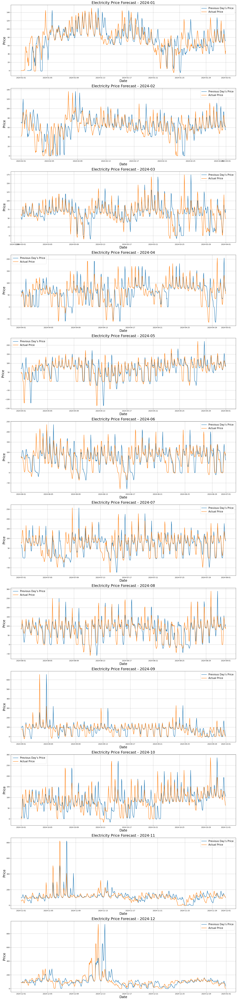

In [8]:
# Create a new figure with multiple subplots, one for each month
unique_months = forecast_df['ds'].dt.to_period('M').unique()
fig, axes = plt.subplots(len(unique_months), 1, figsize=(20, 7 * len(unique_months)))

# Handle the case where there's only 1 month
if len(unique_months) == 1:
    axes = [axes]

for i, month in enumerate(unique_months):
    month_str = str(month)
    forecast_month = forecast_df[forecast_df['ds'].dt.to_period('M') == month]
    test_month = test_df[test_df['ds'].dt.to_period('M') == month]
    
    axes[i].plot(forecast_month['ds'], forecast_month['y_pred'], linewidth=2, label=f'{model_name}')
    axes[i].plot(test_month['ds'], test_month['y'], linewidth=2, label='Actual Price')
    
    axes[i].set_title(f'Electricity Price Forecast - {month_str}', fontsize=22)
    axes[i].set_ylabel('Price', fontsize=20)
    axes[i].set_xlabel('Date', fontsize=20)
    axes[i].legend(prop={'size': 15})
    axes[i].grid()

plt.tight_layout()
plt.show()

In [9]:
# Convert 'ds' to datetime if not already
forecast_df['ds'] = pd.to_datetime(forecast_df['ds'])
test_df['ds'] = pd.to_datetime(test_df['ds'])

# Group by 2-week periods
forecast_df['biweek'] = forecast_df['ds'].dt.to_period('2W')
test_df['biweek'] = test_df['ds'].dt.to_period('2W')

unique_biweeks = forecast_df['biweek'].unique()

fig, axes = plt.subplots(len(unique_biweeks), 1, figsize=(20, 7 * len(unique_biweeks)))
if len(unique_biweeks) == 1:
    axes = [axes]

for i, biweek in enumerate(unique_biweeks):
    biweek_str = str(biweek)
    forecast_biweek = forecast_df[forecast_df['biweek'] == biweek]
    test_biweek = test_df[test_df['biweek'] == biweek]
    
    axes[i].plot(forecast_biweek['ds'], forecast_biweek['y_pred'], linewidth=2, label=f'{model_name}')
    axes[i].plot(test_biweek['ds'], test_biweek['y'], linewidth=2, label='Actual Price')
    
    axes[i].set_title(f'Electricity Price Forecast - {biweek_str}', fontsize=22)
    axes[i].set_ylabel('Price', fontsize=20)
    axes[i].set_xlabel('Date', fontsize=20)
    axes[i].legend(prop={'size': 15})
    axes[i].grid()

plt.tight_layout()
plt.show()

/scratch/slurm_tmpdir/job_25372413/ipykernel_481115/1325008904.py:6: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  forecast_df['biweek'] = forecast_df['ds'].dt.to_period('2W')
/scratch/slurm_tmpdir/job_25372413/ipykernel_481115/1325008904.py:7: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  test_df['biweek'] = test_df['ds'].dt.to_period('2W')
